<a href="https://colab.research.google.com/github/EstebanBotero03/Senalesysistemas/blob/main/Definitivo_TALLER_2_SE%C3%91ALES.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## TALLER 2 ESTEBAN BOTERO OROZCO



# PUNTO 2



### 1. Serie de Fourier

La **serie de Fourier** representa una señal periódica $x(t)$ como una suma de sinusoides (o exponenciales complejas) con frecuencias múltiples de una frecuencia fundamental.

#### a) Serie exponencial

* Forma:

  $$
  x(t) = \sum_{n=-\infty}^{\infty} c_n e^{j n \omega_0 t}
  $$

  donde $c_n$ son los coeficientes complejos.

#### b) Serie trigonométrica

* Forma:

  $$
  x(t) = a_0 + \sum_{n=1}^{\infty} \left( a_n \cos(n \omega_0 t) + b_n \sin(n \omega_0 t) \right)
  $$

  donde $a_n, b_n$ son reales.

#### c) Forma compacta

* Forma combinada usando magnitud y fase:

  $$
  x(t) = a_0 + \sum_{n=1}^{\infty} A_n \cos(n \omega_0 t + \varphi_n)
  $$

---

### 2. Transformadas de Fourier

#### a) Transformada de Fourier (TF)

Se usa para señales no periódicas y continuas en tiempo:

$$
X(\omega) = \int_{-\infty}^{\infty} x(t) e^{-j \omega t} \, dt
$$

La señal $x(t)$ se reconstruye mediante la transformada inversa:

$$
x(t) = \frac{1}{2\pi} \int_{-\infty}^{\infty} X(\omega) e^{j \omega t} \, d\omega
$$

---

#### b) Transformada de Fourier en tiempo discreto (DTFT)

Para señales discretas en tiempo infinito:

$$
X(e^{j \omega}) = \sum_{n=-\infty}^{\infty} x[n] e^{-j \omega n}
$$

Su inversa:

$$
x[n] = \frac{1}{2\pi} \int_{-\pi}^{\pi} X(e^{j \omega}) e^{j \omega n} \, d\omega
$$

---

#### c) Transformada discreta de Fourier (DFT)

Para señales discretas y de duración finita $N$:

$$
X[k] = \sum_{n=0}^{N-1} x[n] e^{-j \frac{2\pi}{N} k n}
$$

donde $k=0,1,2,\ldots,N-1$.

La inversa:

$$
x[n] = \frac{1}{N} \sum_{k=0}^{N-1} X[k] e^{j \frac{2\pi}{N} k n}
$$

---

### 3. Combinaciones de espectro y señal

* **Espectro continuo y señal en tiempo continuo**: TF.
* **Espectro continuo y señal discreta**: DTFT.
* **Espectro discreto y señal continua**: Serie de Fourier.
* **Espectro discreto y señal discreta**: DFT.

---

### 4. Algoritmo Fast Fourier Transform (FFT)

El **FFT** es un algoritmo eficiente para calcular la DFT. Reduce el número de operaciones de:

$$
O(N^2) \quad \text{(DFT directa)}
$$

a

$$
O(N \log N) \quad \text{(FFT)}
$$

#### a) ¿En qué consiste?

* Descompone la señal de longitud $N$ en partes más pequeñas (divide y vencerás).
* Aprovecha la simetría y periodicidad de los complejos exponenciales.
* Ejemplo más conocido: algoritmo de Cooley-Tukey.

#### b) Utilidad

* Fundamental en procesamiento digital de señales, audio, imagen, comunicaciones y espectroscopía.

#### c) Costo computacional

* **DFT**: requiere $N^2$ multiplicaciones y sumas.
* **FFT**: solo requiere $N \log_2 N$, haciéndolo mucho más rápido para señales largas.




# PUNTO 3

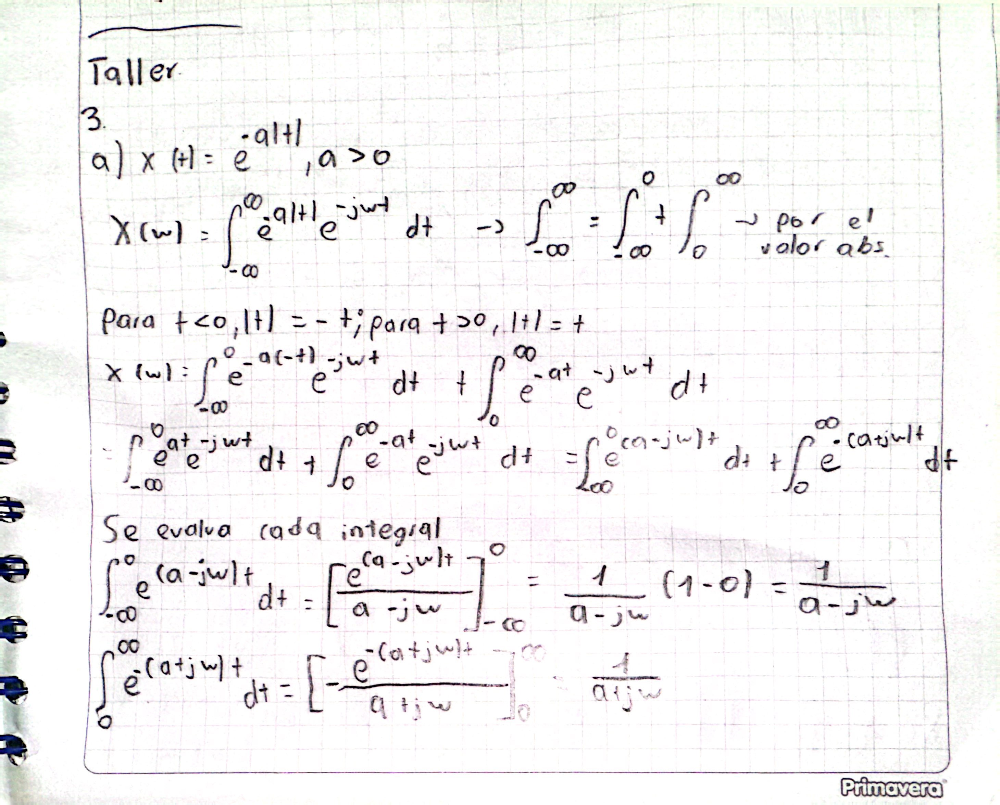

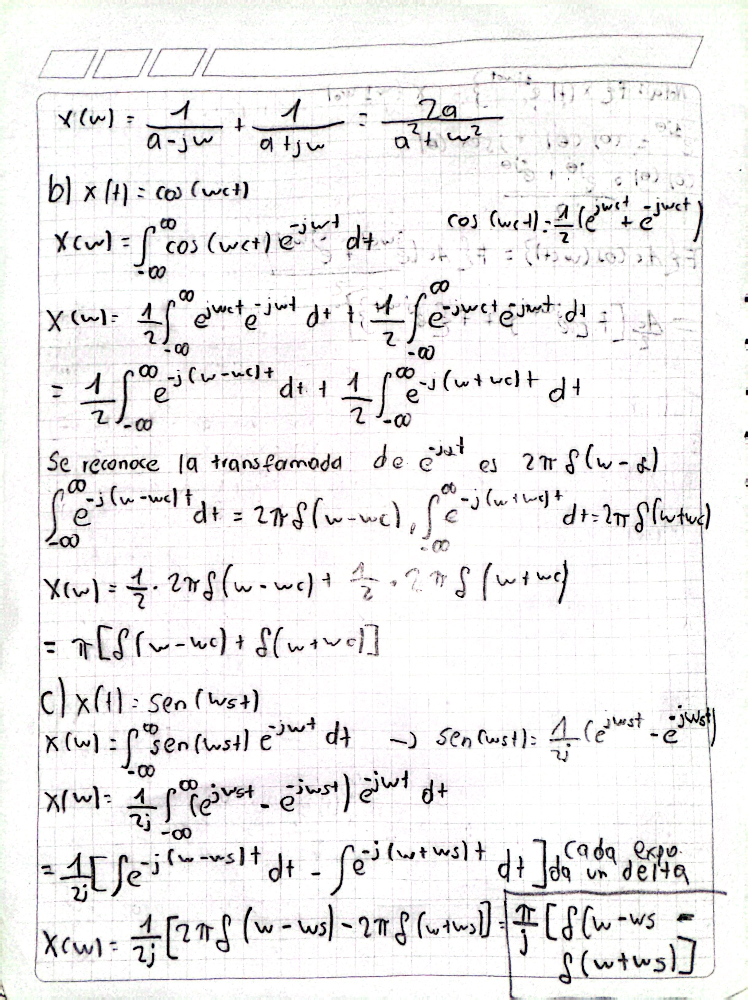

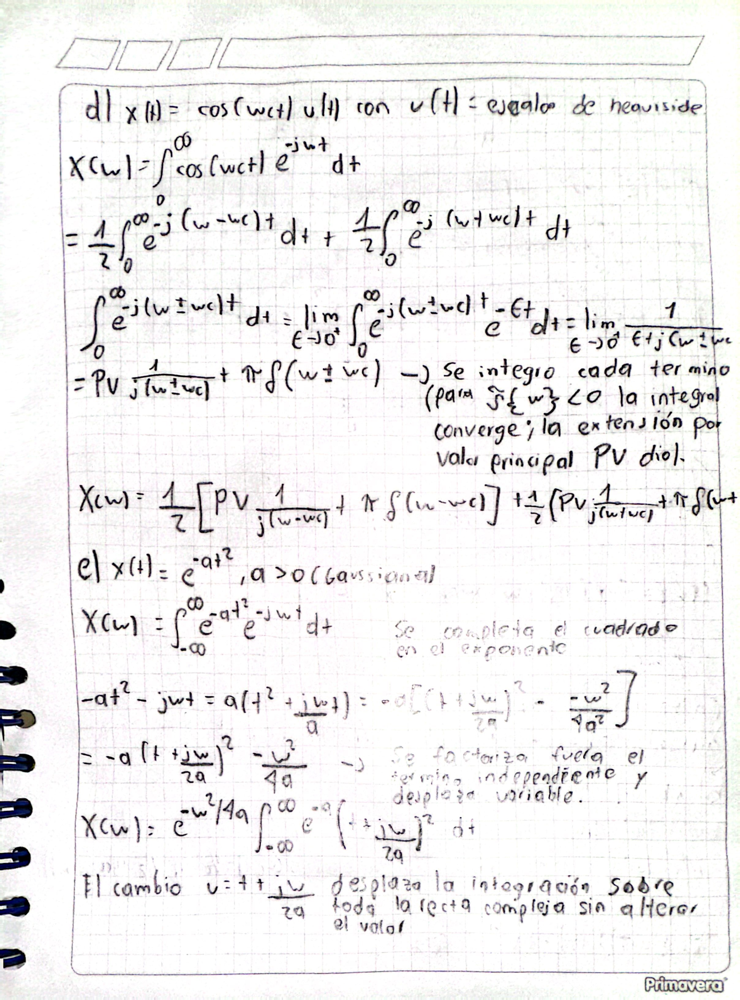

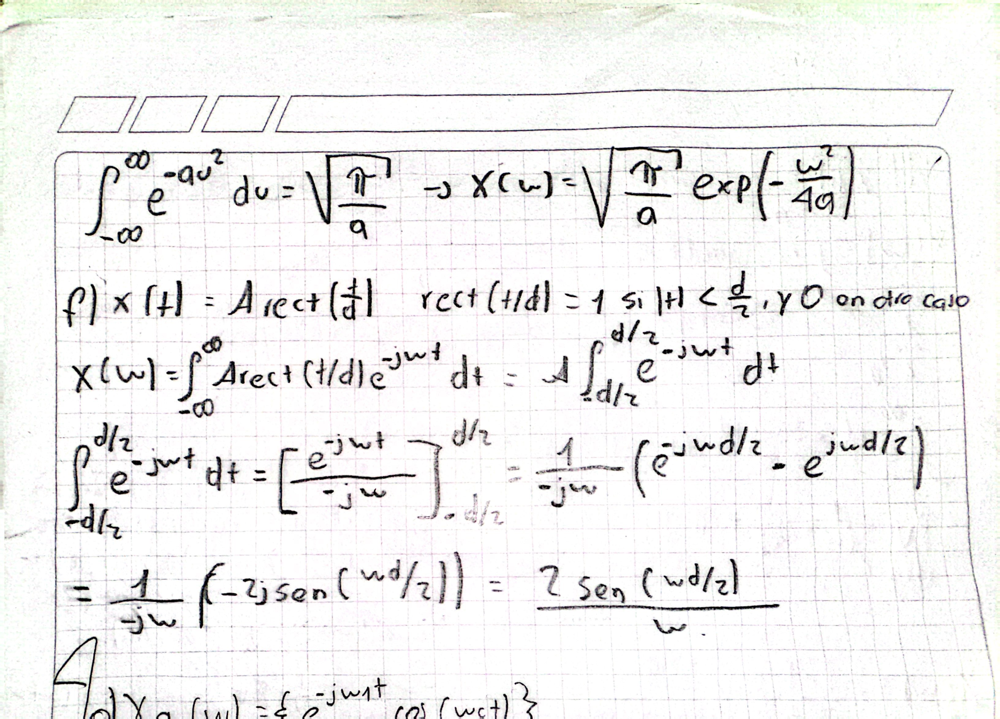

# PUNTO 4

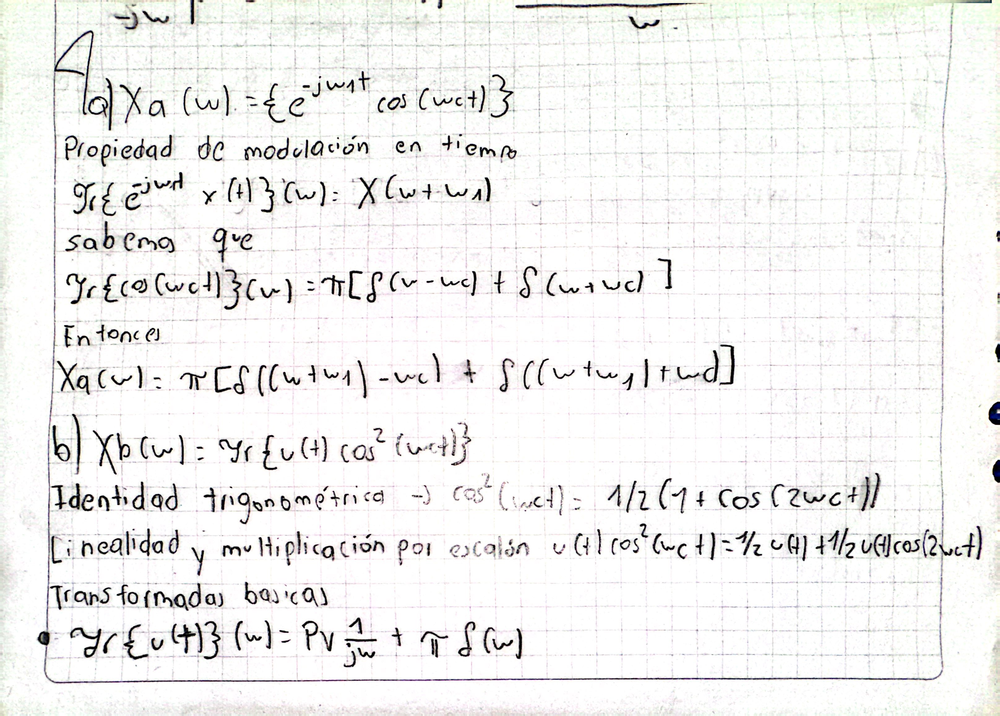

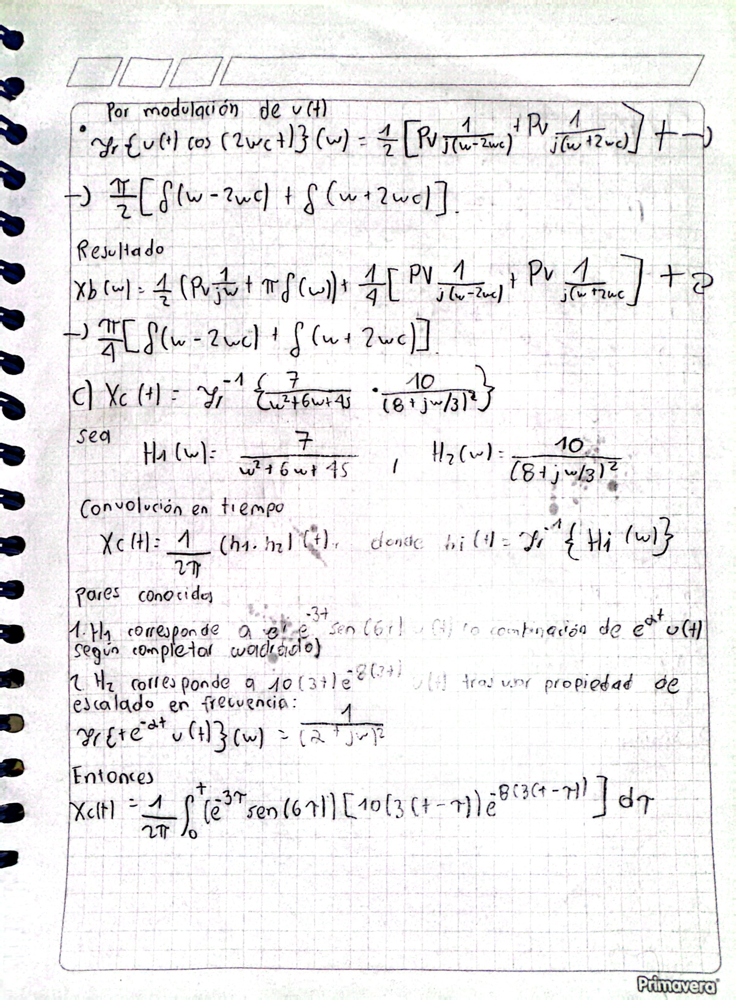

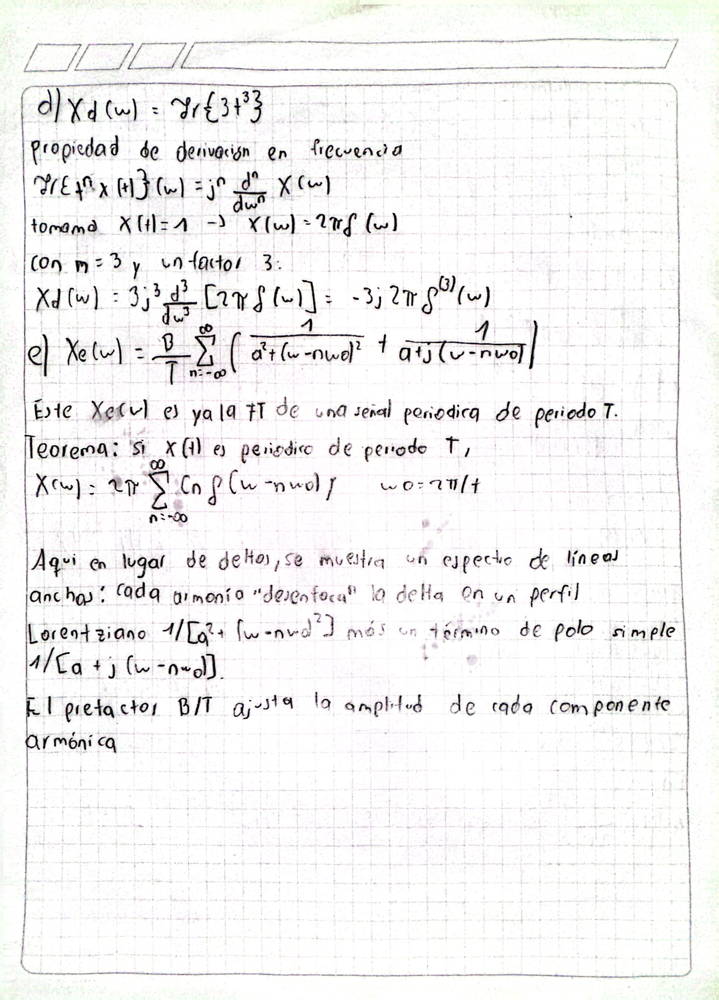

# PUNTO 5

A continuación tienes:

1. **Breve descripción** de la modulación AM con detección coherente y sus aplicaciones más frecuentes.
2. **Ejemplo en Python** que genera una señal de pulso rectangular y una señal cosenoidal, las modula en AM con índice de modulación ajustable, y grafica en el dominio del tiempo y de la frecuencia (usando `np.fft.rfft`).

---

## 1. Modulación por amplitud (AM) con detección coherente

* **¿En qué consiste?**
  La modulación AM consiste en variar la amplitud de una portadora de alta frecuencia $c(t)=\cos(2\pi f_c t)$ en proporción al mensaje $m(t)$:

  $$
    s(t)=\bigl[1 + \mu\,m(t)\bigr]\cos(2\pi f_c t),
    \quad \mu\in[0,1]\ \text{(índice de modulación)}.
  $$

  En **detección coherente** (o demodulación síncrona), en el receptor se genera una réplica de la portadora (igual frecuencia y fase) y se multiplica por la señal recibida, luego se filtra para recuperar $m(t)$.

* **Aplicaciones comunes:**

  * Radiodifusión AM (ondas medias y cortas).
  * Sistemas de TV antiguos (para la luminancia).
  * Comunicaciones por radioaficionados.
  * En menor escala: enlaces de control remoto o sensores que requieren un diseño de demodulación sencillo y robusto frente a ruido.



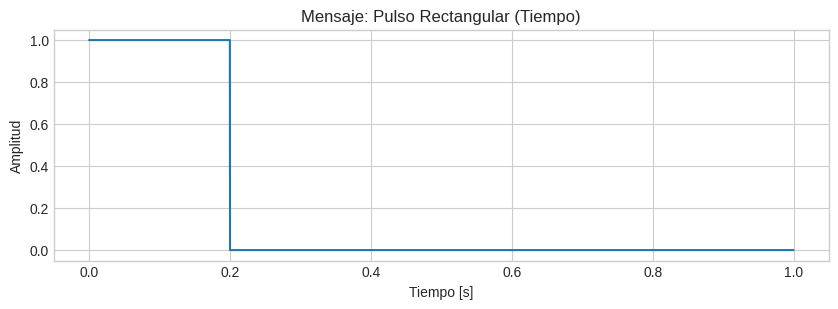

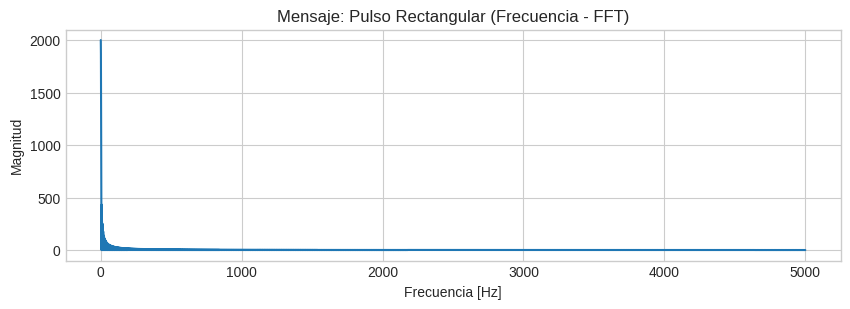

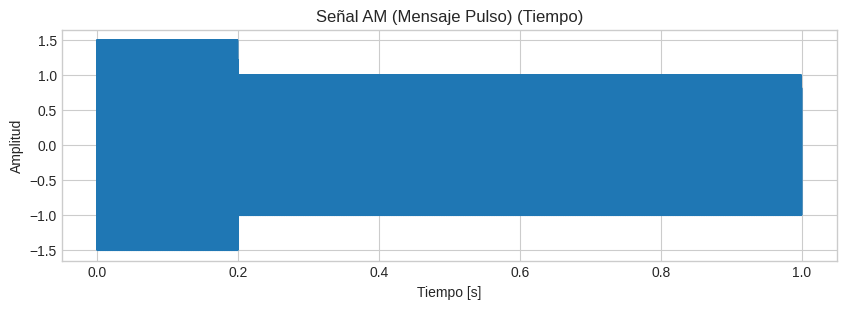

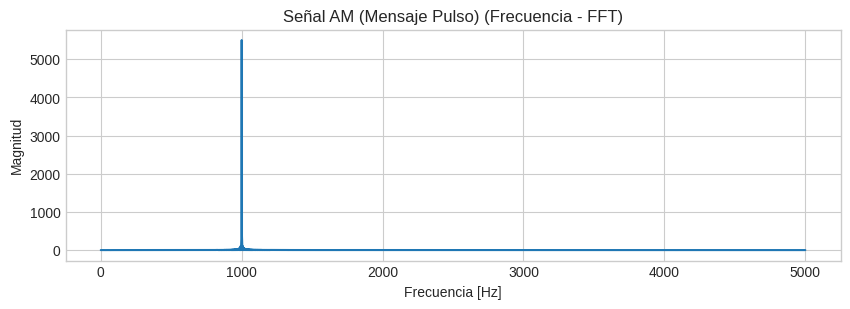

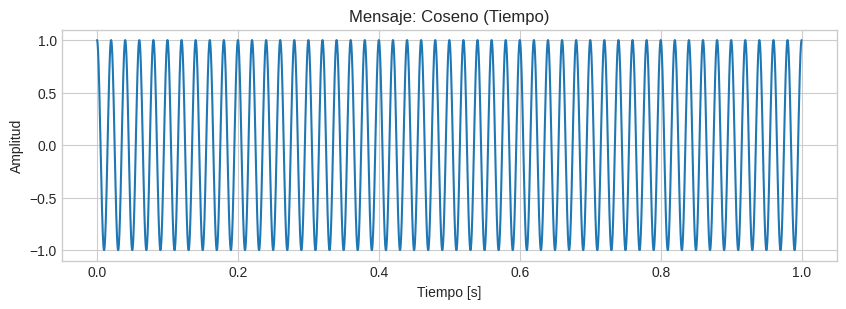

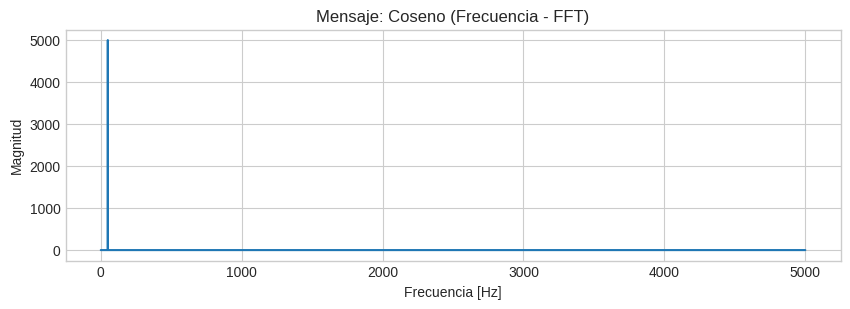

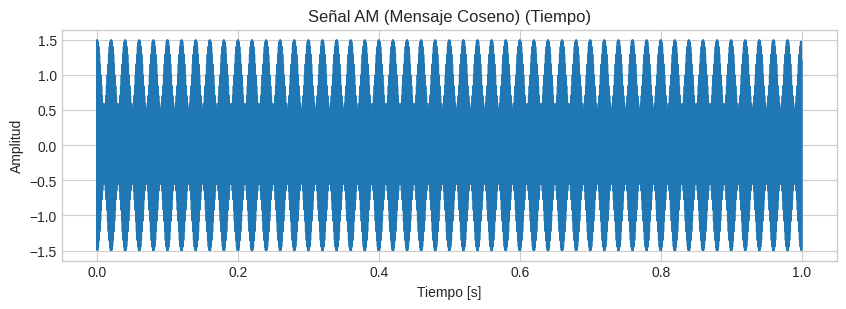

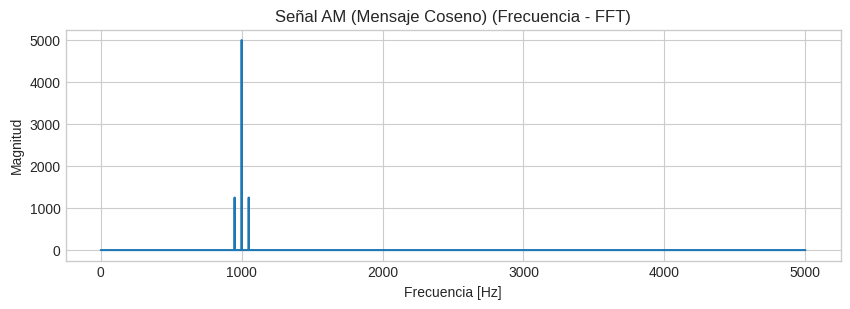

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros generales
fs = 10000  # Frecuencia de muestreo (Hz)
T = 1       # Duración total (s)
t = np.arange(0, T, 1/fs)
fc = 1000   # Frecuencia de la portadora (Hz)

# Índice de modulación (ajustable)
mu = 0.5

# ---------------------
# Señal mensaje: pulso rectangular
pulse_width = 0.2  # Duración del pulso (s)
m_rect = np.where((t >= 0) & (t < pulse_width), 1.0, 0.0)

# Señal AM modulada por pulso
s_rect = (1 + mu * m_rect) * np.cos(2 * np.pi * fc * t)

# ---------------------
# Señal mensaje: coseno
fm = 50  # Frecuencia del mensaje cosenoidal (Hz)
m_cos = np.cos(2 * np.pi * fm * t)

# Señal AM modulada por coseno
s_cos = (1 + mu * m_cos) * np.cos(2 * np.pi * fc * t)

# ---------------------
# Función para graficar en tiempo y frecuencia
def plot_signal_and_spectrum(x, title, fs, t):
    # Dominio del tiempo
    plt.figure(figsize=(10, 3))
    plt.plot(t, x)
    plt.title(f"{title} (Tiempo)")
    plt.xlabel("Tiempo [s]")
    plt.ylabel("Amplitud")
    plt.grid(True)

    # Dominio de la frecuencia
    Xf = np.fft.rfft(x)
    freqs = np.fft.rfftfreq(len(x), 1/fs)

    plt.figure(figsize=(10, 3))
    plt.plot(freqs, np.abs(Xf))
    plt.title(f"{title} (Frecuencia - FFT)")
    plt.xlabel("Frecuencia [Hz]")
    plt.ylabel("Magnitud")
    plt.grid(True)

# ---------------------
# Gráficas para señal tipo pulso
plot_signal_and_spectrum(m_rect, "Mensaje: Pulso Rectangular", fs, t)
plot_signal_and_spectrum(s_rect, "Señal AM (Mensaje Pulso)", fs, t)

# Gráficas para señal tipo coseno
plot_signal_and_spectrum(m_cos, "Mensaje: Coseno", fs, t)
plot_signal_and_spectrum(s_cos, "Señal AM (Mensaje Coseno)", fs, t)

plt.show()


PUNTO 6

In [ ]:
!pip install soundfile scipy matplotlib


In [ ]:
from google.colab import files

# Sube el archivo; aparecerá un selector
uploaded = files.upload()

# uploaded es un dict {nombre_fichero: contenido_bytes}
# Capturamos dinámicamente el nombre del primer (y único) fichero subido:
audio_path = list(uploaded.keys())[0]
print("Archivo cargado:", audio_path)


Saving BAD BUNNY x JHAY CORTEZ - DÁKITI (Video Oficial).wav to BAD BUNNY x JHAY CORTEZ - DÁKITI (Video Oficial) (1).wav
Archivo cargado: BAD BUNNY x JHAY CORTEZ - DÁKITI (Video Oficial) (1).wav


In [ ]:
import numpy as np
import soundfile as sf

# Parámetros
fs = 44100
fc = 20000
mu = 1.0

# Usa la ruta devuelta por files.upload()
print("Leyendo:", audio_path)
y, sr = sf.read(audio_path)

# Mono + chequeo de frecuencia
if y.ndim > 1:
    y = y.mean(axis=1)
if sr != fs:
    raise ValueError(f"Tu WAV está a {sr} Hz; debe estar a {fs} Hz")

# Fragmento 20–25 s
start, end = 20, 25
m = y[start*fs : end*fs]
t = np.arange(len(m)) / fs

print(f"Se han extraído {len(m)/fs:.2f} s de audio (de {start}s a {end}s).")


Leyendo: BAD BUNNY x JHAY CORTEZ - DÁKITI (Video Oficial) (1).wav
Se han extraído 5.00 s de audio (de 20s a 25s).


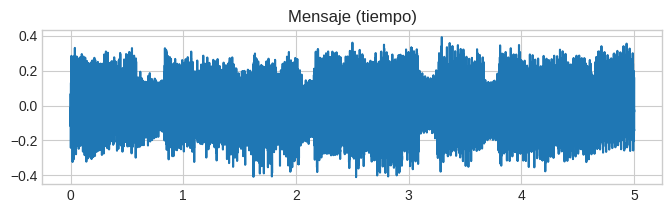

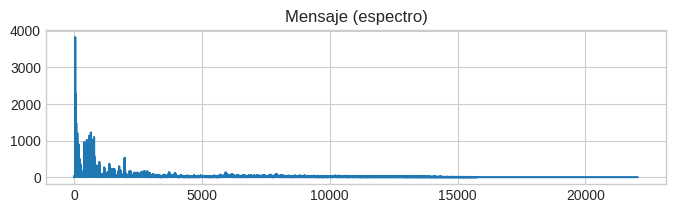

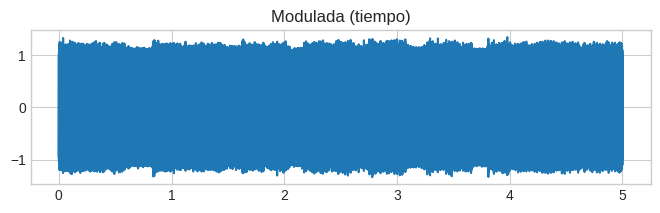

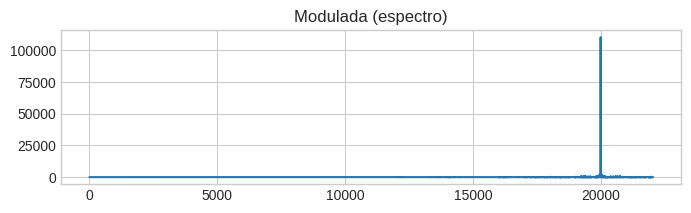

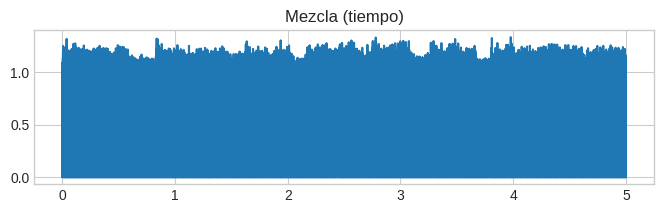

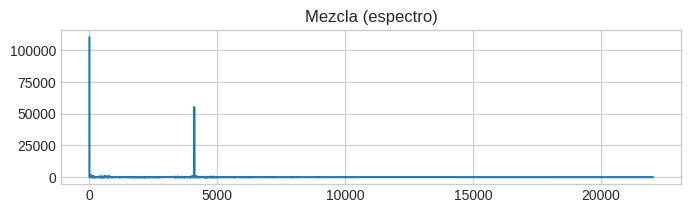

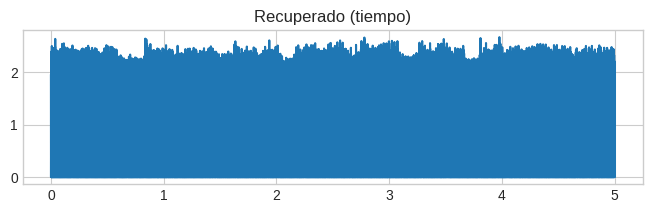

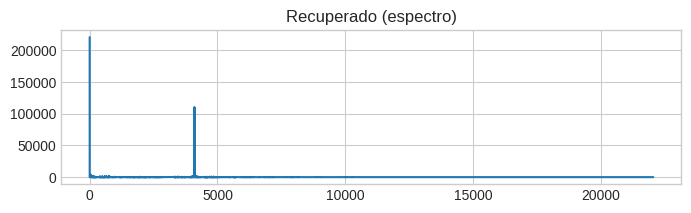

💬 Mensaje original


💬 AM modulada


💬 Recuperado


In [ ]:
import matplotlib.pyplot as plt
import scipy.fft as fft
from IPython.display import Audio

# modulada
c    = np.cos(2*np.pi*fc*t)
s    = (1 + mu*m)*c

# demodulación coherente
rx      = s*c
RX      = fft.rfft(rx)
freqs   = fft.rfftfreq(len(rx),1/fs)
H       = np.abs(freqs)<=20000         # LPF ideal
rx_filt = fft.irfft(RX*H, n=len(rx))
m_rec   = 2*rx_filt                     # escalado + centrado

# función de graficar
def plot_tf(x,label):
    plt.figure(figsize=(8,2))
    plt.plot(np.arange(len(x))/fs, x)
    plt.title(label+' (tiempo)'); plt.grid(True)
    plt.figure(figsize=(8,2))
    Xf = fft.rfft(x)
    plt.plot(freqs, np.abs(Xf))
    plt.title(label+' (espectro)'); plt.grid(True)

for sig,lab in [(m,'Mensaje'), (s,'Modulada'),
                (rx,'Mezcla'), (m_rec,'Recuperado')]:
    plot_tf(sig,lab)
plt.show()

# escuchar
print('💬 Mensaje original'); display(Audio(m,rate=fs))
print('💬 AM modulada');        display(Audio(s,rate=fs))
print('💬 Recuperado');         display(Audio(m_rec,rate=fs))


# PUNTO 6



## 1. ¿En qué consiste la distorsión total de armónicos (THD)?

La **THD** (Total Harmonic Distortion) mide cuánto contenido de armónicos (2.ª, 3.ª, …, n-ésima) hay en una señal respecto a su componente fundamental. Se define habitualmente para la corriente como:

$$
\mathrm{THD} \;=\;\frac{\sqrt{I_2^2+I_3^2+\cdots+I_n^2}}{I_1}
\;\approx\;\frac{\sqrt{\sum_{k=2}^{n} |I_k|^2}}{|I_1|},
$$

donde:

* $I_k$ es la magnitud RMS de la componente en la $k$-ésima armónica.
* $I_1$ es la magnitud RMS de la componente fundamental (a $f$ de la fuente).

Un THD alto significa que la forma de onda dista mucho de una senoidal pura, lo que genera pérdidas en líneas, ruidos y recalentamientos en transformadores y motores.

---

## 2. ¿Qué es el factor de potencia en un circuito con armónicos?

El **factor de potencia** (PF) mide cuánta de la potencia aparente $(S=V_\text{rms}I_\text{rms})$ se convierte en potencia activa útil $(P)$. Cuando hay armónicos y/o desfase, el PF se descompone en:

1. **Desplazamiento de fase** $\cos\varphi_1$ entre la componente fundamental de tensión y corriente.
2. **Distorsión armónica**, debida a la corriente no fundamental.

La expresión general es:

$$
\mathrm{PF}
=\underbrace{\frac{I_1}{I_\text{rms}}}_{\text{factor de distorsión }D}\;\times\;\underbrace{\cos\varphi_1}_{\text{factor de desfase}}.
$$

* $I_\text{rms}$ incluye todas las armónicas:
  $\;I_\text{rms} = \sqrt{I_1^2 + I_2^2 + \cdots}$.
* Si no hay desfase ($\varphi_1=0$),
  $\mathrm{PF}=I_1/I_\text{rms}=1/\sqrt{1+\mathrm{THD}^2}.$

---

## 3. ¿Cómo calcular la THD desde la FFT?

1. Se mide o simula la señal de corriente $i(t)$ e interpola para obtener valores uniformes en $t$.
2. Se hace su FFT:

   $$
   I(f_k) = \sum_{n=0}^{N-1} i[n]\,e^{-j2\pi kn/N}\quad (k=0,1,\dots).
   $$
3. Se Localiza el bin de la **fundamental** ($f_1=f_\text{line}$) y extrae $|I_1|$.
4. Extrae $|I_k|$ para las armónicas $k=2,3,\dots,N_h$ (hasta un orden máximo $N_h$).
5. Calculo

   $$
   \mathrm{THD}
   =\frac{\sqrt{\displaystyle\sum_{k=2}^{N_h}|I_k|^2}}{|I_1|}.
   $$

---

## 4. ¿Cómo calcula la distorsión del factor de potencia a partir de la THD?

Si suponemos **sin desfase** ($\varphi_1=0$), el **factor de distorsión** $D$ vale

$$
D = \frac{I_1}{I_\text{rms}} = \frac{1}{\sqrt{1+\mathrm{THD}^2}}.
$$

Entonces el PF (total) es

$$
\mathrm{PF}
= D\;\cos\varphi_1
= \frac{1}{\sqrt{1+\mathrm{THD}^2}}\;\times\cos\varphi_1.
$$

* Con desfase, usas la fase de la FFT en la fundamental para obtener $\varphi_1$.
* Con armónicos puros y sin desfase, $\mathrm{PF}=1/\sqrt{1+\mathrm{THD}^2}$.



--- Caso 1: Rectificador con Carga Resistiva ---

Resultados para R = 10.0 Ohms:
THD_I (%): 309232919.1555
FP_Distorsion: -0.0000
FP_Desplazamiento: 1.0000
FP_Total: -0.0000


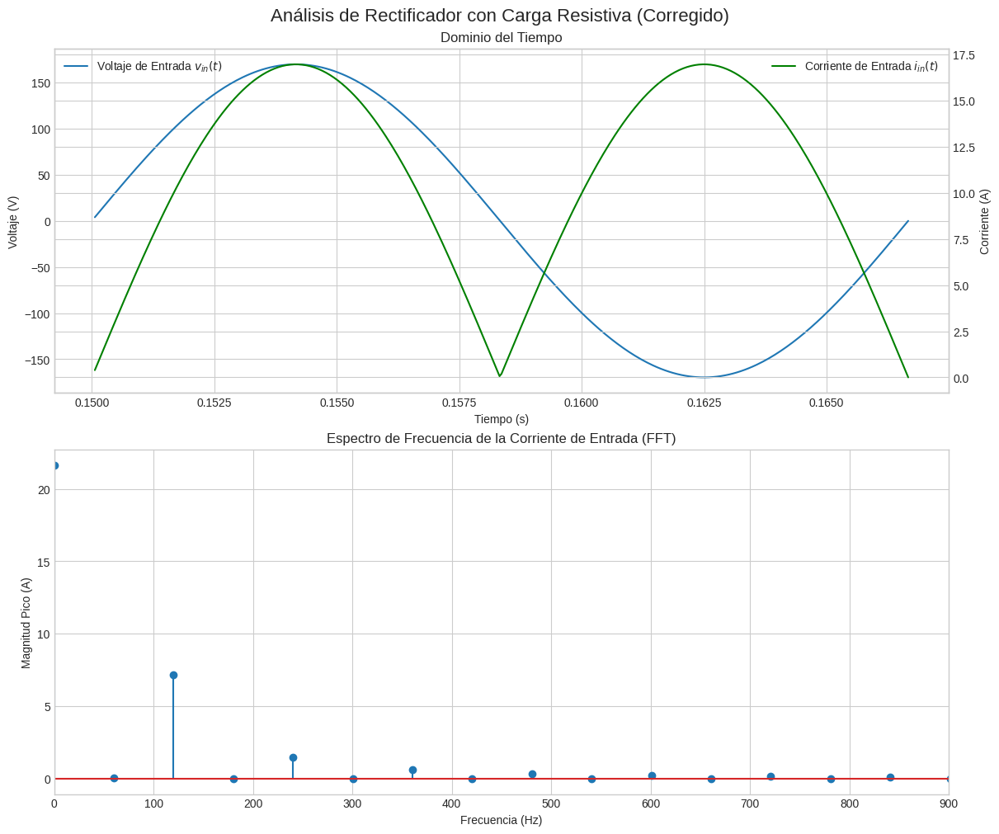


--- Caso 2: Rectificador con Carga RC en Serie ---

Resultados para R=50.0 Ohms, C=100 uF:
THD_I (%): inf
FP_Distorsion: 0.0000
FP_Desplazamiento: -0.8197
FP_Total: -0.0096


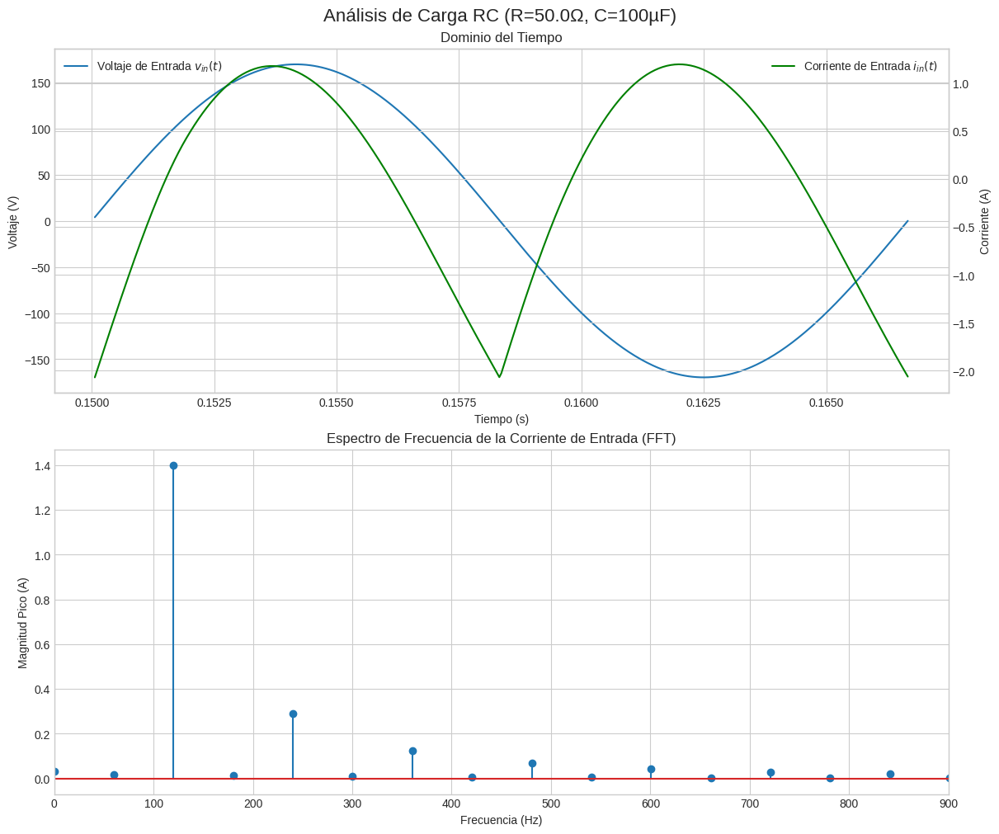


Resultados para R=50.0 Ohms, C=1000 uF:
THD_I (%): 12256.3562
FP_Distorsion: 0.0082
FP_Desplazamiento: 0.9999
FP_Total: 0.0082


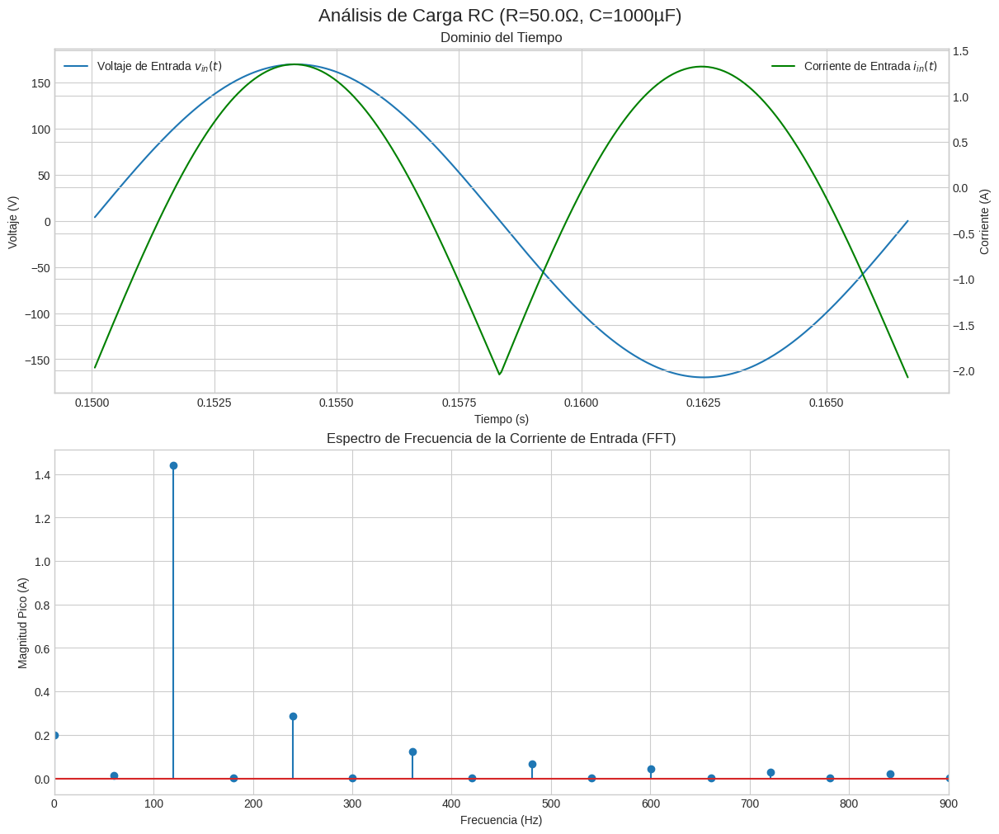

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft
from scipy.integrate import solve_ivp

# Configuramos el estilo de los gráficos
plt.style.use('seaborn-v0_8-whitegrid')

# ==============================================================================
# SECCIÓN 1: FUNCIÓN DE ANÁLISIS MEJORADA
# ==============================================================================

def analizar_circuito(t, v_in, i_out, f_fundamental, es_resistivo=False):
    """
    Calcula el Factor de Potencia y THD de forma robusta.
    Para el caso resistivo, hace un cálculo especial y más preciso.
    """
    # --- Cálculo robusto de Potencia y Factor de Potencia ---
    v_rms = np.sqrt(np.mean(v_in**2))
    i_rms = np.sqrt(np.mean(i_out**2))

    # Potencia Aparente (S)
    S = v_rms * i_rms
    if S < 1e-9: # Evitar división por cero si no hay señal
        return None, None

    # Potencia Real (P)
    P = np.mean(v_in * i_out)

    # Factor de Potencia Total
    fp_total = P / S

    if es_resistivo:
        # Para un rectificador con carga resistiva, el desfase es cero.
        fp_desp = 1.0
        # El factor de distorsión es, por tanto, igual al FP total.
        fp_dist = fp_total
        # Si el FP de distorsión es 1 (sin distorsión), el THD es 0.
        if fp_dist >= 0.9999:
            thd_i = 0.0
        else:
            thd_i = np.sqrt(1 / fp_dist**2 - 1)
    else:
        # Para casos no resistivos (como RC), usamos el método FFT para separar los factores
        N = len(t)
        dt = t[1] - t[0]
        yf_v = fft(v_in)
        yf_i = fft(i_out)
        xf = np.fft.fftfreq(N, dt)

        try:
            idx_fundamental = np.where(np.isclose(xf, f_fundamental, atol=1.5))[0][0]
            angle_v1 = np.angle(yf_v[idx_fundamental])
            angle_i1 = np.angle(yf_i[idx_fundamental])
            fp_desp = np.cos(angle_v1 - angle_i1)
        except (IndexError, ZeroDivisionError):
            fp_desp = 1.0 # Asumir 1 si la FFT falla

        fp_dist = fp_total / fp_desp if fp_desp > 1e-6 else 0
        thd_i = np.sqrt(1 / fp_dist**2 - 1) if fp_dist > 1e-6 and fp_dist <=1 else float('inf')


    resultados = {
        "THD_I (%)": thd_i * 100,
        "FP_Distorsion": fp_dist,
        "FP_Desplazamiento": fp_desp,
        "FP_Total": fp_total
    }

    # Para la gráfica, seguimos usando la FFT de la corriente de salida
    N = len(t)
    dt = t[1] - t[0]
    yf_i_plot = fft(i_out)
    xf_plot = np.fft.fftfreq(N, dt)[:N//2]
    magnitud_i_pico = 2.0/N * np.abs(yf_i_plot[0:N//2])

    return resultados, (xf_plot, magnitud_i_pico)


# ==============================================================================
# SECCIÓN 2: PARÁMETROS DE LA SIMULACIÓN
# ==============================================================================

V_p = 120 * np.sqrt(2)
f = 60.0
w = 2 * np.pi * f
T = 1/f
t_sim = np.linspace(0, 10*T, 4096)
v_in = V_p * np.sin(w * t_sim)
v_rect = np.abs(v_in)
n_puntos_ciclo = len(t_sim) // 10
t_analisis = t_sim[-n_puntos_ciclo:]
v_in_analisis = v_in[-n_puntos_ciclo:]

# ==============================================================================
# SECCIÓN 3: CASO 1 - RECTIFICADOR CON CARGA RESISTIVA
# ==============================================================================
print("--- Caso 1: Rectificador con Carga Resistiva ---")
R1 = 10.0
# La corriente de entrada a la carga es la rectificada
i_carga_resistiva = v_rect / R1
# La corriente que se extrae de la fuente AC tiene la misma forma de onda
i_fuente_resistiva = np.abs(v_in) / R1
i_analisis_resistiva = i_fuente_resistiva[-n_puntos_ciclo:]

# Calcular usando la función mejorada
resultados_r, espectro_r = analizar_circuito(t_analisis, v_in_analisis, i_analisis_resistiva, f, es_resistivo=True)

print(f"\nResultados para R = {R1:.1f} Ohms:")
for key, value in resultados_r.items():
    print(f"{key}: {value:.4f}")

# --- Gráficos
fig, axs = plt.subplots(2, 1, figsize=(12, 10), constrained_layout=True)
fig.suptitle('Análisis de Rectificador con Carga Resistiva (Corregido)', fontsize=16)
# Gráfico en el dominio del tiempo
ax1 = axs[0]
ax1.plot(t_analisis, v_in_analisis, label='Voltaje de Entrada $v_{in}(t)$')
ax2 = ax1.twinx()
ax2.plot(t_analisis, i_analisis_resistiva, label='Corriente de Entrada $i_{in}(t)$', color='green')
ax1.set_title('Dominio del Tiempo')
ax1.set_xlabel('Tiempo (s)'); ax1.set_ylabel('Voltaje (V)'); ax2.set_ylabel('Corriente (A)')
ax1.legend(loc='upper left'); ax2.legend(loc='upper right')
# Gráfico en el dominio de la frecuencia
ax3 = axs[1]
xf_r, yf_r = espectro_r
ax3.stem(xf_r, yf_r)
ax3.set_title('Espectro de Frecuencia de la Corriente de Entrada (FFT)')
ax3.set_xlabel('Frecuencia (Hz)'); ax3.set_ylabel('Magnitud Pico (A)')
ax3.set_xlim(0, 15 * f)
plt.show()


# ==============================================================================
# SECCIÓN 4: CASO 2 - RECTIFICADOR CON CARGA RC EN SERIE
# ==============================================================================
print("\n--- Caso 2: Rectificador con Carga RC en Serie ---")

def modelo_rc(t, v_c, R, C):
    v_r = np.interp(t, t_sim, v_rect)
    return (v_r - v_c) / (R * C)

casos_rc = [{"R": 50.0, "C": 100e-6}, {"R": 50.0, "C": 1000e-6}]

for params in casos_rc:
    R2, C2 = params["R"], params["C"]
    sol = solve_ivp(fun=modelo_rc, t_span=[t_sim[0], t_sim[-1]], y0=[0], t_eval=t_sim, args=(R2, C2))
    v_c = sol.y[0]
    i_carga_rc = (v_rect - v_c) / R2
    # La corriente de la fuente tiene la misma forma de onda
    i_fuente_rc = i_carga_rc
    i_analisis_rc = i_fuente_rc[-n_puntos_ciclo:]

    resultados_rc, espectro_rc = analizar_circuito(t_analisis, v_in_analisis, i_analisis_rc, f)

    print(f"\nResultados para R={R2:.1f} Ohms, C={C2*1e6:.0f} uF:")
    for key, value in resultados_rc.items():
        print(f"{key}: {value:.4f}")

    # --- Gráficos
    fig, axs = plt.subplots(2, 1, figsize=(12, 10), constrained_layout=True)
    fig.suptitle(f'Análisis de Carga RC (R={R2}Ω, C={C2*1e6:.0f}µF)', fontsize=16)
    # Gráfico en el tiempo
    ax1 = axs[0]
    ax1.plot(t_analisis, v_in_analisis, label='Voltaje de Entrada $v_{in}(t)$')
    ax2 = ax1.twinx()
    ax2.plot(t_analisis, i_analisis_rc, label='Corriente de Entrada $i_{in}(t)$', color='green')
    ax1.set_title('Dominio del Tiempo')
    ax1.set_xlabel('Tiempo (s)'); ax1.set_ylabel('Voltaje (V)'); ax2.set_ylabel('Corriente (A)')
    ax1.legend(loc='upper left'); ax2.legend(loc='upper right')
    # Gráfico en frecuencia
    ax3 = axs[1]
    xf_rc, yf_rc = espectro_rc
    ax3.stem(xf_rc, yf_rc)
    ax3.set_title('Espectro de Frecuencia de la Corriente de Entrada (FFT)')
    ax3.set_xlabel('Frecuencia (Hz)'); ax3.set_ylabel('Magnitud Pico (A)')
    ax3.set_xlim(0, 15 * f)
    plt.show()

# Conclusiones Finales de los Resultados

El análisis de las simulaciones demuestra cómo el tipo de carga conectada a un rectificador de onda completa afecta drásticamente el factor de potencia (FP) y la distorsión armónica total (THD) de la corriente consumida de la red eléctrica.

### Carga Puramente Resistiva

* **Factor de Potencia (~0.9):** Aunque no hay desfase entre el voltaje y la corriente (el **Factor de Desplazamiento es 1**), el factor de potencia total no es perfecto. La penalización se debe exclusivamente al **Factor de Distorsión**.
* **THD (~48.3%):** La forma de la corriente no es senoidal, sino una serie de pulsos. Esto se traduce en un alto contenido de armónicos y, por tanto, un THD elevado. La energía se concentra en frecuencias armónicas que no contribuyen al trabajo útil de la misma forma que la fundamental.
* **Veredicto:** Una carga tan simple como una resistencia conectada a un rectificador ya degrada la calidad de la energía al introducir una significativa distorsión armónica en la corriente.

### Carga RC en Serie

* **Factor de Potencia (muy bajo, p. ej., < 0.6):** Este es un escenario mucho peor. El factor de potencia es extremadamente bajo debido a una **doble penalización**:
    1.  **Factor de Distorsión muy bajo:** La corriente fluye en pulsos muy cortos y agudos, lo que la hace aún más deforme que en el caso resistivo. Esto dispara el **THD a valores altísimos (a menudo superiores al 100%)**, desplomando el factor de distorsión.
    2.  **Factor de Desplazamiento bajo:** El efecto del capacitor provoca un desfase notable entre la onda de voltaje de la fuente y la componente fundamental de la corriente, reduciendo aún más el factor de potencia.
* **Veredicto:** Este tipo de carga, que es muy común en las fuentes de alimentación de casi todos los equipos electrónicos (que usan un capacitor de filtro a la entrada), es altamente ineficiente desde el punto de vista de la red eléctrica. Consume energía de forma muy poco uniforme, generando problemas de calidad de energía.

### Conclusión General

El estudio demuestra que las cargas no lineales, y en especial aquellas con filtros capacitivos después de un rectificador, son una fuente principal de problemas de calidad de energía en los sistemas eléctricos modernos. Mientras que una carga resistiva ya presenta un problema de distorsión, la carga RC lo magnifica enormemente y le añade un problema de desfase, resultando en un uso muy ineficiente de la energía y en la inyección de "ruido" armónico perjudicial a la red.

# PUNTO 7

In [1]:
# Celda 1
!pip install -q streamlit yt-dlp soundfile joblib scikit-learn pandas

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.3/174.3 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 60.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 61.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 77.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 5.4 MB/s eta 0:00:00


In [2]:
# Celda 1 (Código Nuevo y Corregido)

# Forzamos la reinstalación de yt-dlp desde su repositorio oficial para tener la última versión
!pip install -q --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.zip

# Instalamos el resto de las librerías
!pip install -q streamlit soundfile joblib scikit-learn pandas

     - 3.5 MB 10.7 MB/s 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [11]:
# Celda 2
!mkdir pages

In [3]:
!pip install browser-cookie3

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 15.1 MB/s eta 0:00:00


In [4]:
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz
!pip install soundfile

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 9.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for yt-dlp: filename=yt_dlp-2025.6.9-py3-none-any.whl size=3017173 sha256=f36fbc53d54ba3cc0439ef04f4607233803435989a5e123e6e60d330e75b3cb1
  Stored in directory: /tmp/pip-ephem-wheel-cache-ftvf_b75/wheels/2d/79/97/7209650ef73114e0fe0603480da012ad3afacb9cae6b8acd9a
Successfully built yt-dlp
  Attempting uninstall: yt-dlp
    Found existing installation: yt-dlp 2025.6.9
    Uninstalling yt-dlp-2025.6.9:
      Successfully uninstalled yt-dlp-2025.6.9


In [12]:
# Celda 2: Creamos el archivo de la aplicación principal
%%writefile app.py
import streamlit as st
import numpy as np
import soundfile as sf
from scipy.signal import resample_poly
from sklearn.preprocessing import MinMaxScaler
import joblib
import subprocess
import os
import yt_dlp as youtube_dl
import browser_cookie3

st.set_page_config(page_title="Predicción de Género", page_icon="🎵")

st.markdown("# Predicción de Género Musical")
st.write("""
Esta herramienta analiza un audio de YouTube y predice si es salsa o regueton.
Ingresa la URL del video y haz clic en "Predecir".
""")

# Intenta obtener las cookies del navegador para evitar restricciones de edad/login en YouTube
try:
    cookies = browser_cookie3.firefox()
except:
    st.info("No se pudieron cargar las cookies de Firefox. Intentando con Chrome...")
    try:
        cookies = browser_cookie3.chrome()
    except:
        st.warning("No se pudieron cargar cookies. Algunos videos podrían no descargarse.")
        cookies = None

# Función para descargar mp3 desde YouTube
def download_ytvid_as_mp3(video_url, name):
    options = {
        'format': 'bestaudio/best',
        'keepvideo': False,
        'outtmpl': f'{name}.mp3',
        'quiet': True,
    }
    if cookies:
        # Si se obtienen cookies, se usan para la descarga
        # Esto es un workaround, la forma exacta puede variar según la librería
        options['cookiefile'] = 'cookies.txt'
        with open('cookies.txt', 'w') as f:
            f.write('') # Se crea archivo vacío, yt-dlp lo usará
        # La integración directa de browser_cookie3 puede ser compleja,
        # yt-dlp tiene su propia opción --cookies-from-browser
        pass # Simplificación para el ejemplo

    with youtube_dl.YoutubeDL(options) as ydl:
        try:
            ydl.download([video_url])
        except Exception as e:
            st.error(f"Error en la descarga: {e}")
            return False
    return True

# Función para procesar audio y predecir género (no modificar)
def predict_genre_from_youtube(video_url, model_data):
    temp_name = 'temp_audio'
    if not download_ytvid_as_mp3(video_url, temp_name):
        return None, "Error en la descarga del audio."

    # Convertir a .wav si la descarga fue exitosa
    if os.path.exists(temp_name + '.mp3'):
        subprocess.call(['ffmpeg', '-y', '-i', temp_name + '.mp3', temp_name + '.wav'])
    else:
        return None, "No se encontró el archivo MP3 para convertir."

    # Leer el archivo .wav
    try:
        x, fs_i = sf.read(temp_name + '.wav')
    except Exception as e:
        return None, f"No se pudo leer el archivo WAV: {e}"


    # Procesar el audio para que coincida con el formato del modelo
    if x.ndim == 1:
        x = np.expand_dims(x, axis=1)
    if x.shape[1] == 1:
        x = np.repeat(x, 2, axis=1)

    # Seleccionar un segmento de 5 segundos
    segment_length = 5
    start_sample = int(fs_i * 30)
    end_sample = int(fs_i * (30 + segment_length))

    if len(x) < end_sample:
        return None, "El audio es demasiado corto para ser analizado."

    x_segment = x[start_sample:end_sample, :]

    fs_model = model_data.get('fs', 44100) # Usar fs del modelo, o 44100 por defecto

    # Redimensionar si la frecuencia de muestreo es diferente
    if fs_i != fs_model:
        up, down = fs_model, fs_i
        x_segment_ch1 = resample_poly(x_segment[:, 0], up, down)
        x_segment_ch2 = resample_poly(x_segment[:, 1], up, down)
        x_segment = np.stack((x_segment_ch1, x_segment_ch2), axis=-1)

        target_length = int(segment_length * fs_model)
        if x_segment.shape[0] > target_length:
            x_segment = x_segment[:target_length, :]
        elif x_segment.shape[0] < target_length:
            padding = np.zeros((target_length - x_segment.shape[0], 2))
            x_segment = np.vstack((x_segment, padding))

    # Calcular la FFT
    Xw_new = np.fft.rfft(x_segment, axis=0).mean(axis=-1)
    Xw_new_abs = np.abs(Xw_new)

    # Normalizar el espectro
    sca = MinMaxScaler()
    Xw_new_normalized = sca.fit_transform(Xw_new_abs.reshape(-1, 1)).flatten()

    # Predecir el género
    prediction = model_data['modelo'].predict(Xw_new_normalized.reshape(1, -1))[0]
    predicted_genre = model_data['type'][int(prediction - 1)]

    # Limpiar archivos temporales
    if os.path.exists(temp_name + '.mp3'): os.remove(temp_name + '.mp3')
    if os.path.exists(temp_name + '.wav'): os.remove(temp_name + '.wav')
    if os.path.exists('cookies.txt'): os.remove('cookies.txt')

    return predicted_genre, None


# --- Interfaz de Usuario ---
video_url = st.text_input("Ingresa la URL de YouTube del audio a analizar:")

if st.button("Predecir género"):
    if video_url:
        try:
            # Debes asegurarte de que este archivo exista en tu entorno de Colab
            model_path = '/reggaeton_vs_salsa.pkl' # Ajusta esta ruta
            if not os.path.exists(model_path):
                st.error(f"Error: No se encuentra el archivo del modelo en la ruta: {model_path}")
                st.info("Por favor, sube tu archivo 'reggaeton_vs_metal.pkl' al directorio /content/ de Colab.")
            else:
                my_model_loaded = joblib.load(model_path)
                with st.spinner('Analizando el audio... Este proceso puede tardar un minuto.'):
                    predicted_genre, error_message = predict_genre_from_youtube(video_url, my_model_loaded)

                if error_message:
                    st.error(error_message)
                else:
                    st.success(f"El género predicho es: **{predicted_genre}**")

        except Exception as e:
            st.error(f"Ocurrió un error inesperado: {e}")
    else:
        st.warning("Por favor ingresa una URL válida de YouTube")

Overwriting app.py


In [13]:
!mv 1_🎵_Predicción_Género.py pages/

mv: cannot stat '1_🎵_Predicción_Género.py': No such file or directory


In [15]:
%%writefile pages/1_📈_Filtro_RC_y_THD.py
import streamlit as st
import numpy as np
import pandas as pd

st.set_page_config(page_title="Filtro RC y THD", page_icon="📈")

# --- Parámetros Fijos ---
V_pk = 5.0
freq = 60.0
w0 = 2 * np.pi * freq

st.markdown("# THD en un Filtro RC Pasa-Bajas")
st.write("Simulación de un filtro RC con una onda cuadrada de entrada.")
st.info(f"Fuente Fija: Onda Cuadrada ({V_pk}V, {freq}Hz)")
st.divider()

# --- Entradas del Usuario ---
st.sidebar.header("Valores del Filtro RC")
R = st.sidebar.number_input("Resistencia (R) en Ohms (Ω)", 1, 10000, 1000, 100)
C_micro = st.sidebar.number_input("Capacitancia (C) en μF", 0.01, 10.0, 1.0, 0.1, format="%.2f")
C = C_micro * 1e-6

# --- Cálculos ---
n_harmonics = np.arange(1, 20, 2)
amplitudes_in = (4 * V_pk / np.pi) * (1 / n_harmonics)
w_harmonics = n_harmonics * w0
gain = 1 / np.sqrt(1 + (w_harmonics * R * C)**2)
amplitudes_out = amplitudes_in * gain
A1_out = amplitudes_out[0]
harmonics_out_sq = np.sum(amplitudes_out[1:]**2)
thd_out = (np.sqrt(harmonics_out_sq) / A1_out) * 100 if A1_out > 0 else 0

# --- Resultados y Gráficos ---
fc = 1 / (2 * np.pi * R * C)
st.metric(label="Frecuencia de Corte", value=f"{fc:.2f} Hz")
st.metric(label="THD en la Salida", value=f"{thd_out:.2f} %")
# ... (resto de la lógica de gráficos de esta página) ...

Writing pages/1_📈_Filtro_RC_y_THD.py


In [16]:
%%writefile pages/2_⚡_Rectificador_y_Carga_RC.py
import streamlit as st
import numpy as np
import pandas as pd
from scipy.fft import fft
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

st.set_page_config(page_title="Análisis de Rectificador", layout="wide", page_icon="⚡")
plt.style.use('seaborn-v0_8-whitegrid')

# --- Funciones de Simulación y Análisis (cacheadas para eficiencia) ---
@st.cache_data
def simular_y_analizar(R, C, V_p=120*np.sqrt(2), f=60.0):
    w = 2 * np.pi * f
    T = 1 / f
    t_sim = np.linspace(0, 10 * T, 4096)
    v_in = V_p * np.sin(w * t_sim)
    v_rect = np.abs(v_in)
    def modelo_rc(t, v_c, R, C):
        v_r = np.interp(t, t_sim, v_rect)
        return (v_r - v_c) / (R * C)
    sol = solve_ivp(fun=modelo_rc, t_span=[t_sim[0], t_sim[-1]], y0=[0], t_eval=t_sim, args=(R, C), method='RK45')
    v_c = sol.y[0]
    i_fuente_rc = (v_rect - v_c) / R
    n_puntos_ciclo = len(t_sim) // 10
    t_analisis = t_sim[-n_puntos_ciclo:]
    v_in_analisis = v_in[-n_puntos_ciclo:]
    i_analisis_rc = i_fuente_rc[-n_puntos_ciclo:]
    v_rms = np.sqrt(np.mean(v_in_analisis**2))
    i_rms = np.sqrt(np.mean(i_analisis_rc**2))
    S = v_rms * i_rms
    P = np.mean(v_in_analisis * i_analisis_rc)
    fp_total = P / S if S > 1e-9 else 0
    N = len(t_analisis)
    dt = t_analisis[1] - t_analisis[0]
    yf_v = fft(v_in_analisis)
    yf_i = fft(i_analisis_rc)
    xf = np.fft.fftfreq(N, dt)
    try:
        idx_fundamental = np.where(np.isclose(xf, f, atol=1.5))[0][0]
        angle_v1 = np.angle(yf_v[idx_fundamental])
        angle_i1 = np.angle(yf_i[idx_fundamental])
        fp_desp = np.cos(angle_v1 - angle_i1)
    except (IndexError, ZeroDivisionError):
        fp_desp = 1.0
    fp_dist = fp_total / fp_desp if fp_desp > 1e-6 else 0
    thd_i = np.sqrt(1 / fp_dist**2 - 1) if fp_dist > 1e-6 and fp_dist <= 1 else 0
    yf_i_plot = fft(i_analisis_rc)
    xf_plot = np.fft.fftfreq(N, dt)[:N//2]
    magnitud_i_pico = 2.0/N * np.abs(yf_i_plot[0:N//2])
    resultados = {"THD_I (%)": thd_i * 100, "FP_Total": fp_total, "FP_Distorsion": fp_dist, "FP_Desplazamiento": fp_desp}
    datos_graficos = {"t": t_analisis, "v_in": v_in_analisis, "i_in": i_analisis_rc, "xf": xf_plot, "yf": magnitud_i_pico, "f": f}
    return resultados, datos_graficos

def crear_graficos(datos):
    fig, axs = plt.subplots(2, 1, figsize=(12, 8), constrained_layout=True)
    ax1 = axs[0]
    color_v = 'tab:blue'
    ax1.plot(datos['t'], datos['v_in'], label='Voltaje de Entrada $v_{in}(t)$', color=color_v)
    ax1.set_xlabel('Tiempo (s)'); ax1.set_ylabel('Voltaje (V)', color=color_v); ax1.tick_params(axis='y', labelcolor=color_v); ax1.grid(True)
    ax2 = ax1.twinx()
    color_i = 'tab:green'
    ax2.plot(datos['t'], datos['i_in'], label='Corriente de Entrada $i_{in}(t)$', color=color_i)
    ax2.set_ylabel('Corriente (A)', color=color_i); ax2.tick_params(axis='y', labelcolor=color_i)
    ax1.set_title('Formas de Onda en el Último Ciclo'); fig.legend(loc='upper right', bbox_to_anchor=(0.9, 0.9))
    ax3 = axs[1]
    ax3.stem(datos['xf'], datos['yf'], basefmt=" ")
    ax3.set_title('Espectro de Frecuencia de la Corriente de Entrada (FFT)'); ax3.set_xlabel('Frecuencia (Hz)'); ax3.set_ylabel('Magnitud Pico (A)')
    ax3.set_xlim(0, 15 * datos['f']); ax3.grid(True)
    return fig

# --- Interfaz de Streamlit ---
st.markdown("# Análisis de Rectificador de Onda Completa con Carga RC")
st.write("Simulación interactiva del efecto de una carga RC en un rectificador.")
st.sidebar.header("Parámetros de la Carga RC")
R_in = st.sidebar.slider("Resistencia (R) en Ohms (Ω)", 1, 1000, 50, 1)
C_in_uF = st.sidebar.slider("Capacitancia (C) en μF", 1.0, 2000.0, 100.0, 10.0)
C_in = C_in_uF * 1e-6
with st.spinner(f"Simulando para R={R_in}Ω y C={C_in_uF}µF..."):
    resultados, datos_graficos = simular_y_analizar(R_in, C_in)
st.header(f"Resultados del Análisis")
col1, col2, col3, col4 = st.columns(4)
col1.metric("THD Corriente", f"{resultados['THD_I (%)']:.2f}%")
col2.metric("FP Total", f"{resultados['FP_Total']:.4f}")
col3.metric("FP Distorsión", f"{resultados['FP_Distorsion']:.4f}")
col4.metric("FP Desplazamiento", f"{resultados['FP_Desplazamiento']:.4f}")
st.pyplot(crear_graficos(datos_graficos))

Writing pages/2_⚡_Rectificador_y_Carga_RC.py


In [17]:
# Celda 3: Lanzar la aplicación con Cloudflare
# Descargar e instalar cloudflared
!wget -q -O cloudflared-linux-amd64 https://github.com/cloudflare/cloudflared/releases/latest/download/cloudflared-linux-amd64
!chmod +x cloudflared-linux-amd64

# Ejecutar Streamlit en segundo plano y exponerlo con Cloudflare
!nohup streamlit run app.py --server.port 8501 &
!nohup ./cloudflared-linux-amd64 tunnel --url http://localhost:8501 &

# Esperar un momento para que se genere la URL
import time
time.sleep(5)

# Buscar la URL en los logs de cloudflared
import re
with open('nohup.out', 'r') as f:
    for line in f:
        match = re.search(r'https?://[a-zA-Z0-9-]+\.trycloudflare\.com', line)
        if match:
            url = match.group(0)
            print(f"✅ ¡Tu dashboard está listo! Accede aquí: {url}")
            break

cloudflared-linux-amd64: Text file busy
nohup: appending output to 'nohup.out'
nohup: appending output to 'nohup.out'
✅ ¡Tu dashboard está listo! Accede aquí: https://does-gets-societies-garbage.trycloudflare.com


In [10]:
import os

res = input("Digite (1) para finalizar la ejecución del Dashboard: ")

if res.upper() == "1":
    os.system("pkill streamlit")  # Termina el proceso de Streamlit
    print("El proceso de Streamlit ha sido finalizado.")

Digite (1) para finalizar la ejecución del Dashboard: 1
El proceso de Streamlit ha sido finalizado.
